# Predict Trip Duration

## Load Data

In [1]:
import pandas as pd 
import numpy as np

In [2]:
df = pd.read_csv('200-top-trip-patterns.csv',index_col=0)

In [3]:
# pattern = pd.read_csv('data.csv',index_col=0)
df.describe()

,tripduration,start station id,start station latitude,start station longitude,end station id,end station latitude,end station longitude,bikeid,birth year,age,start_weekday,start_hour,distance
count,33369.000000,33369.000000,33369.000000,33369.000000,33369.000000,33369.000000,33369.000000,33369.000000,33369.000000,33369.000000,33369.000000,33369.000000,33369.000000
mean,769.947706,2010.047439,40.744905,-73.982635,1978.696545,40.745099,-73.982581,33869.788966,1982.633552,37.366448,2.914981,14.083551,1.846257
std,598.995217,1439.740514,0.030533,0.022294,1468.839432,0.031453,0.022622,8832.341530,11.687470,11.687470,2.075142,4.534178,1.669875
min,61.000000,72.000000,40.661063,-74.017134,72.000000,40.661063,-74.017134,14533.000000,1951.000000,16.000000,0.000000,0.000000,0.117072
25%,289.000000,487.000000,40.722281,-74.002777,472.000000,40.720368,-74.002777,28528.000000,1975.000000,29.000000,1.000000,11.000000,0.692474
50%,530.000000,2012.000000,40.746920,-73.980680,3016.000000,40.745497,-73.981854,36782.000000,1986.000000,34.000000,3.000000,15.000000,1.135562
75%,1181.000000,3259.000000,40.765005,-73.962246,3282.000000,40.765005,-73.960940,41130.000000,1991.000000,45.000000,5.000000,18.000000,2.447986
max,2490.000000,3993.000000,40.842842,-73.912555,3992.000000,40.842842,-73.912555,44542.000000,2004.000000,69.000000,6.000000,23.000000,7.314112


In [4]:
df_paths = df.groupby([
    'trip_pattern_pair',
    'start station longitude',
    'start station latitude',
    'end station longitude',
    'end station latitude'
    ]).mean().reset_index()

def normalize(x):
    return (x - x.min())/(x.max()-x.min())

df_paths['color']=(df_paths['tripduration']-df_paths['tripduration'].min())/(df_paths['tripduration'].max()-df_paths['tripduration'].min())

In [5]:
mapbox_access_token = 'pk.eyJ1IjoiYW5keXRyYW4xMTk5NiIsImEiOiJjam9xeXg2aTMwOWRlM3FvOWk2NDF0N3F4In0.zvrXbjWVMU7dHWHAeLeA4w'
from matplotlib import cm

#Generate a color scale
cmap = cm.get_cmap('Spectral')

df_paths.rename(columns={
    'start station longitude':'startlon',
    'start station latitude':'startlat',
    'end station longitude':'endlon',
    'end station latitude': 'endlat'
}, inplace= True)

import plotly.graph_objects as go

fig = go.Figure(go.Scattermapbox())

for index, row in df_paths.iterrows():
    rgba = cmap(row.color)
    rgba = tuple(int((255*x)) for x in rgba[0:3])
    rgba = 'rgb'+str(rgba)

    fig.add_trace(go.Scattermapbox(
        mode = "markers+lines",
        lon = [row.startlon, row.endlon],
        lat = [row.startlat, row.endlat],
        marker = {
            'size': 7,
            'color':['blue', rgba]
            },
        line=dict(
            color = rgba,
            )
        ))

fig.update_layout(
    autosize=True,
    hovermode='closest',
    margin ={'l':0,'t':0,'b':0,'r':0},
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=dict(
            lat=40.76,
            lon=-73.99
        ),
        pitch=0,
        zoom=12
    ),
    showlegend = False)
fig.show()

In [6]:
# df = pd.get_dummies(df, columns=['trip_pattern_pair'])
df = pd.get_dummies(df, columns=['part_of_day'])
df = pd.get_dummies(df, columns=['start station name'])


In [7]:
df.columns

Index(['tripduration', 'starttime', 'stoptime', 'start station id',
       'start station latitude', 'start station longitude', 'end station id',
       'end station name', 'end station latitude', 'end station longitude',
       ...
       'start station name_W 22 St & 8 Ave',
       'start station name_W 33 St & 7 Ave',
       'start station name_W 37 St & 10 Ave',
       'start station name_W 52 St & 11 Ave',
       'start station name_W 59 St & West End Ave',
       'start station name_W 76 St & Columbus Ave',
       'start station name_West Drive & Prospect Park West',
       'start station name_West St & Chambers St',
       'start station name_West St & Liberty St',
       'start station name_West Thames St'],
      dtype='object', length=123)

In [8]:
df.shape

(33369, 123)

## Linear Regression

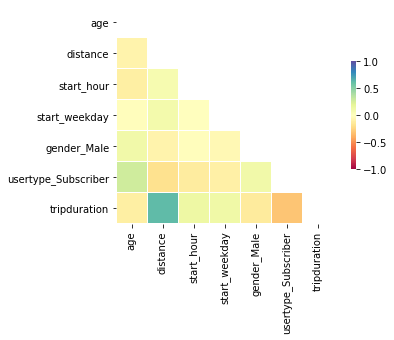

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

# Compute the correlation matrix
corr = df[['age', 'distance','start_hour', 'start_weekday', 'gender_Male','usertype_Subscriber','tripduration']].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots()

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0, vmin=-1,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

Text(0, 0.5, 'trip duration')

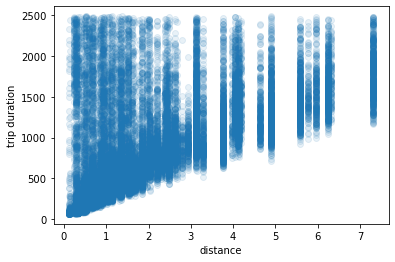

In [10]:
plt.scatter(df["distance"],df["tripduration"], alpha=0.1)
plt.xlabel('distance')
plt.ylabel('trip duration')


In [11]:
features = df.drop(labels=[
    'tripduration', 
    'starttime', 
    'stoptime', 
    'start station id',
    # 'start station name', 
    'start station latitude',
    'start station longitude', 
    'end station id', 
    'end station name',
    'end station latitude',
    'end station longitude',
    'bikeid',
    'birth year',
    'start_hour',
    'start_weekday',
    'trip_pattern',
    # 'distance',
    "trip_pattern_pair"
    ],axis=1)

features

,age,is_weekend,distance,gender_Male,usertype_Subscriber,part_of_day_afternoon,part_of_day_early morning,part_of_day_evening,part_of_day_morning,part_of_day_noon,...,start station name_W 22 St & 8 Ave,start station name_W 33 St & 7 Ave,start station name_W 37 St & 10 Ave,start station name_W 52 St & 11 Ave,start station name_W 59 St & West End Ave,start station name_W 76 St & Columbus Ave,start station name_West Drive & Prospect Park West,start station name_West St & Chambers St,start station name_West St & Liberty St,start station name_West Thames St
53,35,False,0.479912,False,True,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
265,67,False,2.408746,True,True,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
418,33,False,0.692474,True,True,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
590,40,False,1.675867,True,True,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
720,35,False,0.479912,False,True,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1881643,33,False,0.415595,False,True,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1881748,32,False,1.342434,True,True,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1881981,31,False,0.752832,False,True,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1882081,44,False,1.141961,False,True,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [12]:
# interaction effect
features['workday_early morning'] = features['part_of_day_early morning'] * ~features['is_weekend']
features['workday_morning'] = features['part_of_day_morning'] * ~features['is_weekend']
features['workday_noon'] = features['part_of_day_noon'] * ~features['is_weekend']
features['workday_afternoon'] = features['part_of_day_afternoon'] * ~features['is_weekend']
features['workday_evening'] = features['part_of_day_evening'] * ~features['is_weekend']

features['weekend_early_morning'] = features['part_of_day_early morning'] * features['is_weekend']
# features['weekend_morning'] = features['part_of_day_morning'] * features['is_weekend']
features['weekend_noon'] = features['part_of_day_noon'] * features['is_weekend']
features['weekend_afternoon'] = features['part_of_day_afternoon'] * features['is_weekend']
features['weekend_evening'] = features['part_of_day_evening'] * features['is_weekend']


In [13]:
features = features.drop(labels=[
       'part_of_day_afternoon', 
       'part_of_day_early morning',
       'part_of_day_evening', 
       'part_of_day_morning', 
       'part_of_day_noon', 
       'is_weekend',
       ], axis=1)

In [14]:
target = pd.DataFrame(df, columns=['tripduration'])

In [15]:
target.describe()

,tripduration
count,33369.000000
mean,769.947706
std,598.995217
min,61.000000
25%,289.000000
50%,530.000000
75%,1181.000000
max,2490.000000


In [16]:
from sklearn.linear_model import LinearRegression, LassoCV, RidgeCV, lars_path
linReg = LinearRegression(fit_intercept=False).fit(features ,target)
linReg.score(features,target)

0.5235608401035168

In [17]:
from sklearn.feature_selection import f_regression
F, pval = f_regression(features,target)
ftest = pd.DataFrame({
    'features':features.columns,
    'coef':linReg.coef_[0],
    'pval':pval.round(4)
    })
pd.set_option('display.max_rows', ftest.shape[0]+1)

ftest


,features,coef,pval
0,age,0.116879,0.0000
1,distance,161.795711,0.0000
2,gender_Male,-74.245603,0.0000
3,usertype_Subscriber,-185.886791,0.0000
4,start station name_1 Ave & E 30 St,405.033702,0.0000
5,start station name_1 Ave & E 44 St,502.830047,0.0182
6,start station name_1 Ave & E 5 St,412.036935,0.0000
7,start station name_1 Ave & E 62 St,504.769254,0.0000
8,start station name_1 Ave & E 68 St,494.083849,0.0000
9,start station name_1 Ave & E 78 St,496.623288,0.0000


In [18]:
todrop = ftest[ftest['pval']>0.05]['features'].to_list()

In [19]:
revised = features.drop(columns=todrop,axis=1)
 

Text(0, 0.5, 'y_actual')

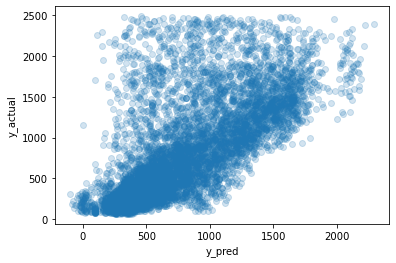

In [62]:
from sklearn.model_selection import cross_val_score, train_test_split
X_train, X_test, y_train, y_test = train_test_split(revised, target, random_state=50)
linReg = LinearRegression(fit_intercept=False).fit(X_train, y_train)
predictions = linReg.predict(X_test)
plt.scatter(predictions,y_test,alpha=0.2)
plt.xlabel("y_pred")
plt.ylabel('y_actual')

In [21]:
# from sklearn.model_selection import cross_val_score, train_test_split
# X_train, X_test, y_train, y_test = train_test_split(features, target, random_state=50)
# linReg = LinearRegression(fit_intercept=False).fit(X_train, y_train)
# predictions = linReg.predict(X_test)
# plt.scatter(predictions,y_test,alpha=0.2)
# plt.xlabel("y_pred")
# plt.ylabel('y_actual')


In [63]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test, predictions, squared=False)


428.1459671311497

In [60]:
linReg.score(revised, target)

0.5012476108254467

In [24]:
# linReg.fit(revised, target)

In [59]:
scores=cross_val_score(linReg, revised, target, cv=10)
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))



Accuracy: 0.49 (+/- 0.03)


In [26]:
F, pval = f_regression(revised,target)
ftest2 = pd.DataFrame({
    'features':revised.columns,
    'coef':linReg.coef_[0].round(2),
    'pval':pval.round(2)
    })
pd.set_option('display.max_rows', ftest.shape[0]+1)

ftest2

,features,coef,pval
0,age,3.04,0.00
1,distance,177.45,0.00
2,gender_Male,-52.13,0.00
3,usertype_Subscriber,-134.62,0.00
4,start station name_1 Ave & E 30 St,-75.18,0.00
5,start station name_1 Ave & E 44 St,11.13,0.02
6,start station name_1 Ave & E 5 St,-57.07,0.00
7,start station name_1 Ave & E 62 St,31.15,0.00
8,start station name_1 Ave & E 68 St,8.33,0.00
9,start station name_1 Ave & E 78 St,16.37,0.00


In [27]:
from sklearn.model_selection import GridSearchCV
import warnings


warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=DeprecationWarning)


def print_results(results):
    print('BEST PARAMS: {}\n'.format(results.best_params_))

    means = results.cv_results_['mean_test_score']
    stds = results.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, results.cv_results_['params']):
        print('{} (+/-{}) for {}'.format(round(mean, 3), round(std * 2, 3), params))

### RidgeCV

In [64]:
ridReg = RidgeCV(    
    cv=10, 
    alphas=[1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 1e2],
    )
ridReg.fit(X_train, y_train)
ridReg.score(revised, target)

0.5210335638981394

Text(0, 0.5, 'y_actual')

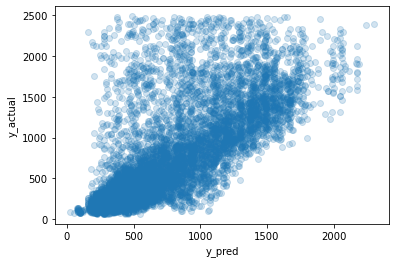

In [66]:
predictions = ridReg.predict(X_test)
plt.scatter(predictions,y_test,alpha=0.2)
plt.xlabel("y_pred")
plt.ylabel('y_actual')

In [65]:
mean_squared_error(y_test, ridReg.predict(X_test), squared=False)

420.9775492315127

### LassoCV

In [30]:
lasReg = LassoCV(
    cv=10, 
    alphas=[1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 1e2],
    max_iter=10000,
    n_jobs=-1
    )
lasReg.fit(X_train, y_train)
lasReg.score(X_train, y_train)

0.5249807210481281

In [69]:
lasReg.score(revised, target)

0.5210325372550052

Text(0, 0.5, 'y_actual')

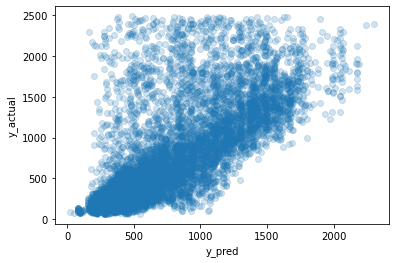

In [67]:
predictions = lasReg.predict(X_test)
plt.scatter(predictions,y_test,alpha=0.2)
plt.xlabel("y_pred")
plt.ylabel('y_actual')

In [70]:
mean_squared_error(y_test, lasReg.predict(X_test), squared=False)

420.9754636065395

In [32]:
lasReg.coef_

array([ 8.63650261e-02,  1.62753674e+02, -7.38405727e+01, -1.83409372e+02,
       -2.70008199e+02, -1.79258354e+02, -2.47975819e+02, -1.62170155e+02,
       -1.79365329e+02, -1.75670131e+02, -1.15307412e+02,  3.31965301e+02,
        3.54658567e+01, -2.30150785e+02, -1.81466220e+02, -1.77025158e+02,
        2.22048847e+02,  3.59966646e+00, -1.15524754e+02,  1.83894492e+02,
       -1.10827354e+02,  1.45172352e+02, -2.10591855e+02,  9.99085125e+01,
       -1.49909200e+02, -2.08079172e+02, -1.98982119e+02, -1.81905853e+02,
        2.00446330e+02, -2.22395099e+02, -1.82823181e+02, -2.26618499e+02,
       -2.18804520e+02,  3.06467763e+02,  2.97357178e+02, -2.26907270e+02,
        3.55067103e+02,  3.49232371e+02,  2.39578142e+02, -3.03908917e+02,
        1.51835897e+02, -2.26052692e+02, -1.71405881e+02, -2.58937318e+02,
       -1.13441896e+02, -3.11420964e+02,  1.10235959e+02, -3.05214046e+02,
       -1.93023881e+02, -1.99703030e+02, -2.60061006e+02, -1.98912924e+02,
       -2.82893575e+02, -

In [71]:
scores=cross_val_score(lasReg, revised, target, cv=10)
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Accuracy: 0.51 (+/- 0.03)


In [72]:
scores=cross_val_score(ridReg, revised, target, cv=10, n_jobs=7)
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Accuracy: 0.51 (+/- 0.03)


In [35]:
# lasReg.path(X_train, y_train, alphas=[1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 1e2])

In [36]:
F, pval = f_regression(revised,target)
ftest2 = pd.DataFrame({
    'features':revised.columns,
    'coef':lasReg.coef_.round(2),
    'pval':pval.round(2)
    })
pd.set_option('display.max_rows', ftest.shape[0]+1)

ftest2

,features,coef,pval
0,age,0.09,0.00
1,distance,162.75,0.00
2,gender_Male,-73.84,0.00
3,usertype_Subscriber,-183.41,0.00
4,start station name_1 Ave & E 30 St,-270.01,0.00
5,start station name_1 Ave & E 44 St,-179.26,0.02
6,start station name_1 Ave & E 5 St,-247.98,0.00
7,start station name_1 Ave & E 62 St,-162.17,0.00
8,start station name_1 Ave & E 68 St,-179.37,0.00
9,start station name_1 Ave & E 78 St,-175.67,0.00


## Regression Tree

In [37]:
# Regreesion Tree
tr_features = df.drop(labels=[
    'tripduration', 
    'starttime',
    'stoptime',
    'start station id',
    # 'start station name', 
    'start station latitude',
    'start station longitude', 
    'end station id', 
    'end station name',
    'end station latitude',
    'end station longitude',
    'bikeid',
    'birth year',
    # 'start_hour',
    # 'start_weekday',
    'trip_pattern',
    'part_of_day_afternoon', 
    'part_of_day_early morning',
    'part_of_day_evening', 
    'part_of_day_morning', 
    'part_of_day_noon', 
    'is_weekend', 
    # 'is_roundtrip',
    'trip_pattern_pair',
    ],axis=1)



Text(0, 0.5, 'y_actual')

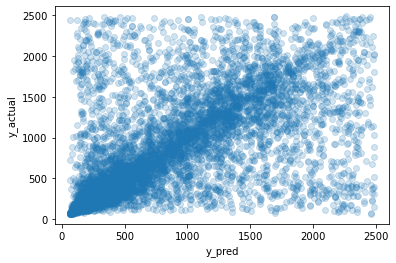

In [38]:
from sklearn.tree import DecisionTreeRegressor, plot_tree

import matplotlib.pyplot as plt

tr_X_train, tr_X_test, tr_y_train, tr_y_test = train_test_split(tr_features, target, random_state=40)
treeReg = DecisionTreeRegressor().fit(tr_X_train, tr_y_train)
predictions = treeReg.predict(tr_X_test)
plt.scatter(predictions, tr_y_test, alpha=0.2)
plt.xlabel("y_pred")
plt.ylabel('y_actual')

In [39]:
# get importance
importance = treeReg.feature_importances_
# summarize feature importance
im = pd.DataFrame(data={
    'features':tr_features.columns,
    'importance': importance
})
im = im.sort_values(by='importance',ascending=False)

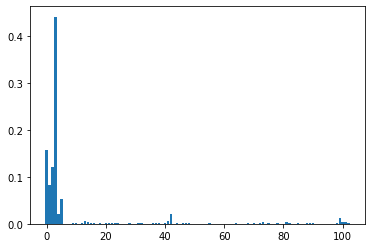

In [40]:
# for i,v in enumerate(importance):
# 	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

In [41]:
tr_revised = tr_features.drop(columns=)

SyntaxError: invalid syntax (<ipython-input-41-f29ca3b5d334>, line 1)

In [42]:
mean_squared_error(tr_y_test, predictions, squared=False)

527.378348860272

In [43]:
treeReg = DecisionTreeRegressor().fit(tr_features, target)
tr_scores = cross_val_score(treeReg, tr_features, target, cv=10)
print("Accuracy: %0.2f (+/- %0.2f)" % (tr_scores.mean(), tr_scores.std() * 2))

Accuracy: 0.14 (+/- 0.12)


In [44]:
treeReg.score(tr_X_train, tr_y_train)

0.99208865365004

In [52]:
treeReg.score(tr_features, target)

0.992058411576795

## Pruning the tree

In [48]:
# https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html
clf = DecisionTreeRegressor(random_state=0)
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

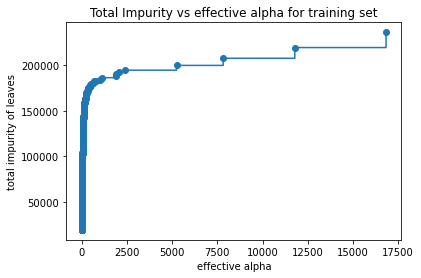

In [49]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [50]:
len(ccp_alphas)

12566

In [51]:
clfs = []
for ccp_alpha in ccp_alphas[2::500]:
    clf = DecisionTreeRegressor(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 181 with ccp_alpha: 121549.12329189907


In [52]:
len(clfs)

26

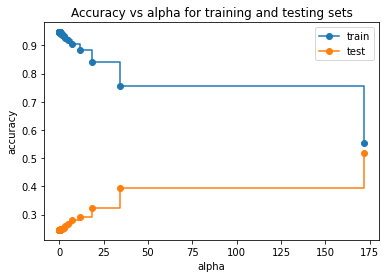

In [53]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas[2::500], train_scores, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alphas[2::500], test_scores, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [74]:
# DecisionTreeRegressor(ccp_alpha=171.7056667704869, random_state=0)

pruned = clfs[-1]

NameError: name 'clfs' is not defined

In [76]:
pruned = DecisionTreeRegressor(ccp_alpha=171.7056667704869, random_state=0)
pruned.fit(features, target)

DecisionTreeRegressor(ccp_alpha=171.7056667704869, random_state=0)

Text(0, 0.5, 'y_actual')

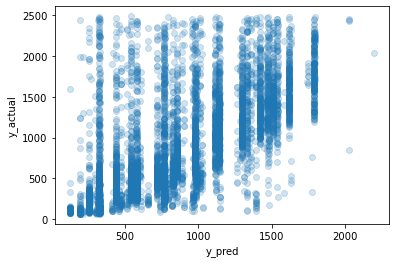

In [55]:
predictions = clfs[-1].predict(X_test)
plt.scatter(predictions, y_test, alpha=0.2)
plt.xlabel("y_pred")
plt.ylabel('y_actual')

In [58]:
mean_squared_error(y_test, pruned.predict(X_test), squared=False)

417.55261799143415

In [63]:
pruned.score(X_test,y_test)

0.5171346581564263

In [77]:
pruned.score(features,target)

0.5420645030292857

In [78]:
pr_scores = cross_val_score(pruned, features, target, cv=10, n_jobs=7,verbose=1)
print("Accuracy: %0.2f (+/- %0.2f)" % (pr_scores.mean(), tr_scores.std() * 2))

[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
Accuracy: 0.52 (+/- 0.12)
[Parallel(n_jobs=7)]: Done   8 out of  10 | elapsed:    7.7s remaining:    1.9s
[Parallel(n_jobs=7)]: Done  10 out of  10 | elapsed:    7.8s finished


## Ramdon Forest

In [47]:
import joblib
from sklearn.ensemble import RandomForestRegressor

In [69]:
rf = RandomForestRegressor(n_jobs=7, verbose=1)
parameters = {
    'n_estimators': [500, 1000, 1500, 2000], # up to 2000
    'max_depth': [2, 4, 8, 16, 32, None],
    'ccp_alpha' : [0, 171.7056667704869]
}



In [70]:
cv = GridSearchCV(rf, parameters, cv=5, n_jobs=7,verbose=1)

In [71]:
cv.fit(X_train, y_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:  3.9min
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed: 45.4min
[Parallel(n_jobs=7)]: Done 240 out of 240 | elapsed: 143.0min finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    7.3s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:   34.7s
[Parallel(n_jobs=7)]: Done 436 tasks      | elapsed:  1.3min
[Parallel(n_jobs=7)]: Done 786 tasks      | elapsed:  2.2min
[Parallel(n_jobs=7)]: Done 1236 tasks      | elapsed:  3.4min
[Parallel(n_jobs=7)]: Done 1786 tasks      | elapsed:  4.9min
[Parallel(n_jobs=7)]: Done 2000 out of 2000 | elapsed:  5.5min finished


GridSearchCV(cv=5, estimator=RandomForestRegressor(n_jobs=7, verbose=1),
             n_jobs=7,
             param_grid={'ccp_alpha': [0, 171.7056667704869],
                         'max_depth': [2, 4, 8, 16, 32, None],
                         'n_estimators': [500, 1000, 1500, 2000]},
             verbose=1)

In [73]:
print_results(cv)

BEST PARAMS: {'ccp_alpha': 171.7056667704869, 'max_depth': 32, 'n_estimators': 2000}

0.424 (+/-0.035) for {'ccp_alpha': 0, 'max_depth': 2, 'n_estimators': 500}
0.424 (+/-0.034) for {'ccp_alpha': 0, 'max_depth': 2, 'n_estimators': 1000}
0.424 (+/-0.034) for {'ccp_alpha': 0, 'max_depth': 2, 'n_estimators': 1500}
0.424 (+/-0.035) for {'ccp_alpha': 0, 'max_depth': 2, 'n_estimators': 2000}
0.489 (+/-0.028) for {'ccp_alpha': 0, 'max_depth': 4, 'n_estimators': 500}
0.489 (+/-0.028) for {'ccp_alpha': 0, 'max_depth': 4, 'n_estimators': 1000}
0.489 (+/-0.028) for {'ccp_alpha': 0, 'max_depth': 4, 'n_estimators': 1500}
0.489 (+/-0.028) for {'ccp_alpha': 0, 'max_depth': 4, 'n_estimators': 2000}
0.532 (+/-0.02) for {'ccp_alpha': 0, 'max_depth': 8, 'n_estimators': 500}
0.533 (+/-0.019) for {'ccp_alpha': 0, 'max_depth': 8, 'n_estimators': 1000}
0.533 (+/-0.02) for {'ccp_alpha': 0, 'max_depth': 8, 'n_estimators': 1500}
0.532 (+/-0.019) for {'ccp_alpha': 0, 'max_depth': 8, 'n_estimators': 2000}
0.551 (

In [72]:
joblib.dump(cv.best_estimator_, 'RF_model_pruned.pkl')

['RF_model_pruned.pkl']

In [88]:
# joblib.dump(cv.best_estimator_, 'RF_model.pkl')

['RF_model.pkl']

In [75]:
# rf = joblib.load('RF_model.pkl')

In [ ]:
rf = joblib('RF_model_pruned.pkl')

Text(0, 0.5, 'y_actual')

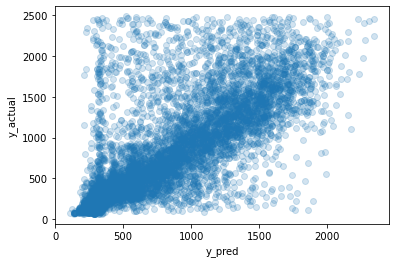

In [56]:
rf_predictions = rf.predict(tr_X_test)
plt.scatter(rf_predictions, tr_y_test, alpha=0.2)
plt.xlabel("y_pred")
plt.ylabel('y_actual')

In [79]:
mean_squared_error(tr_y_test, rf_predictions, squared=False)

402.97044826250874

In [85]:
rf.score(X_train, y_train)

[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 436 tasks      | elapsed:    0.2s
[Parallel(n_jobs=7)]: Done 786 tasks      | elapsed:    0.4s
[Parallel(n_jobs=7)]: Done 1236 tasks      | elapsed:    0.6s
[Parallel(n_jobs=7)]: Done 1786 tasks      | elapsed:    0.9s
[Parallel(n_jobs=7)]: Done 2000 out of 2000 | elapsed:    1.0s finished


0.6000591003560276

In [84]:
rf_scores = cross_val_score(rf, X_train, y_test, cv=10, n_jobs=7,verbose=1)
print("Accuracy: %0.2f (+/- %0.2f)" % (rf_scores.mean(), tr_scores.std() * 2))

[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done   8 out of  10 | elapsed: 17.0min remaining:  4.3min


KeyboardInterrupt: 

In [48]:
rf = RandomForestRegressor(n_estimators=1500, max_depth=16, n_jobs=7, verbose=0)
rf.fit(tr_X_train, tr_y_train)
rf.score(tr_X_train, tr_y_train)

0.7823329127145113

In [49]:
rf.score(tr_X_test, tr_y_test)

0.5605005887028323

In [50]:
rf.score(tr_features, target)

0.7252506057112249

In [51]:
rf_scores = cross_val_score(rf, tr_features, target, cv=10, n_jobs=7,verbose=0)
print("Accuracy: %0.2f (+/- %0.2f)" % (rf_scores.mean(), tr_scores.std() * 2))

Accuracy: 0.54 (+/- 0.12)


In [63]:
# rf_predictions = rf.predict(tr_X_test)
# plt.scatter(rf_predictions, tr_y_test)

In [64]:
# mean_squared_error(tr_y_test, rf_predictions, squared=False)

In [65]:
# from sklearn.neighbors import NearestNeighbors
# knn_cv= 

# parameters = {
#     'n_neighbors': [500, 1000, 1500, 2000], # up to 2000
#     'max_depth': [2, 4, 8, 16, 32, None]
# }
